## Preparing notebook

In [1]:
!pip install keras --upgrade
!pip install tensorflow --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 725.8 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 6.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 23.0 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 3.0.5
    Uninstalling keras-3.0.5:
      Successfully uninstalled keras-3.0.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.2.1 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.0 MB/s eta 0:00:0000:0100:02m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 7.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 7.5 MB/s eta 0:0

## Import required libraries

In [2]:
import os
import shutil
import random
import warnings
import numpy as np
from PIL import Image
from keras.models import Model
from matplotlib import pyplot as plt
from progressbar import ProgressBar
from keras.applications import vgg19, inception_v3
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
warnings.filterwarnings('ignore')

## Check and delete photo with bad format😠😠😠

In [3]:
extensions = []
error = []
for fldr in os.listdir('/kaggle/input/food-images/train'):
    sub_folder_path = os.path.join('/kaggle/input/food-images/train', fldr)
    for filee in os.listdir(sub_folder_path):
        file_path = os.path.join(sub_folder_path, filee)
        print('** Path: {}  **'.format(file_path), end="\r", flush=True)
        try:
            im = Image.open(file_path)
            rgb_im = im.convert('RGB')
            if filee.split('.')[1] not in extensions:
                extensions.append(filee.split('.')[1])
        except:
            error.append(file_path)
error

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[]

## Try to balancing dataset😡😡😡

In [4]:
shutil.rmtree('/kaggle/working/datas', ignore_errors=True)

In [5]:
os.mkdir('/kaggle/working/datas')
base_path = '/kaggle/input/food-images/train'
new_path = '/kaggle/working/datas'
labels = os.listdir(base_path)
p = ProgressBar(max_value=len(labels))
p.start()
for i, label in enumerate(labels):
    os.mkdir(os.path.join(new_path, label))
    new_path_1 = os.path.join(new_path, label)
    pics = os.listdir(os.path.join(base_path, label))
    pic_num = min(len(pics), 1200)
    np.random.shuffle(pics)
    for pic in pics[:pic_num]:
        shutil.copy(os.path.join(os.path.join(base_path, label), pic), new_path_1)
    p.update(i + 1)
p.finished()

100% (22 of 22) |########################| Elapsed Time: 0:01:08 ETA:  00:00:000305

False

## Load images

### Choose model

In [6]:
image_generator = ImageDataGenerator(
    rescale=1 / 255.0,
    validation_split=0.1,
)

In [7]:
training_data = image_generator.flow_from_directory(
    directory='/kaggle/working/datas',
    class_mode='categorical',
    batch_size=32,
    target_size=(224,224),
    subset='training',
    shuffle=True,
    seed=42,
)

Found 17045 images belonging to 22 classes.


In [8]:
validation_data = image_generator.flow_from_directory(
    directory='/kaggle/working/datas',
    class_mode='categorical',
    batch_size=32,
    target_size=(224,224),
    subset='validation',
    shuffle=True,
    seed=42
)

Found 1884 images belonging to 22 classes.


#### Show some picture from train datas

In [9]:
def get_key(dict, val):
    for key, value in dict.items():
        if value==val:
            return key
    return 'Invalid value'

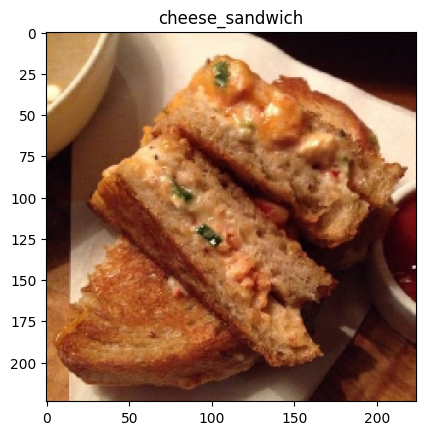

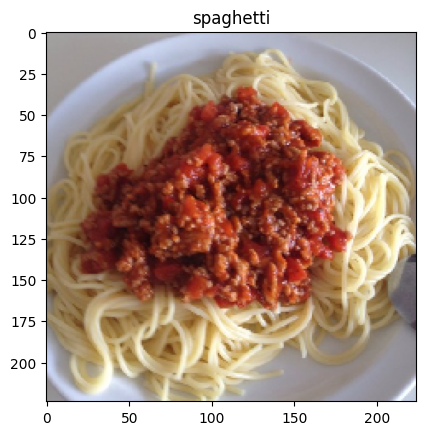

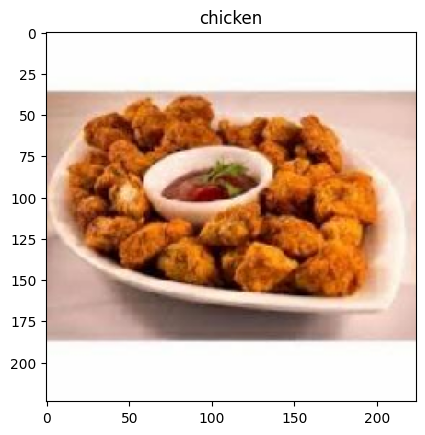

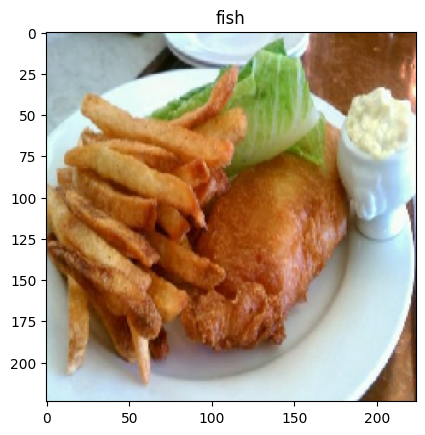

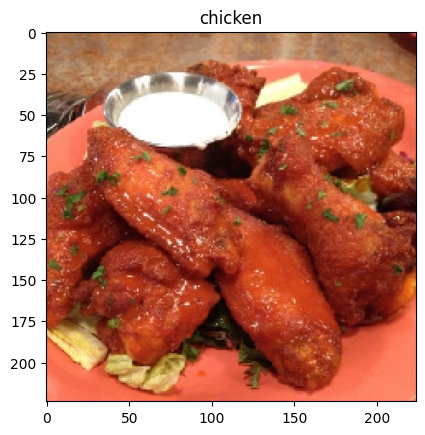

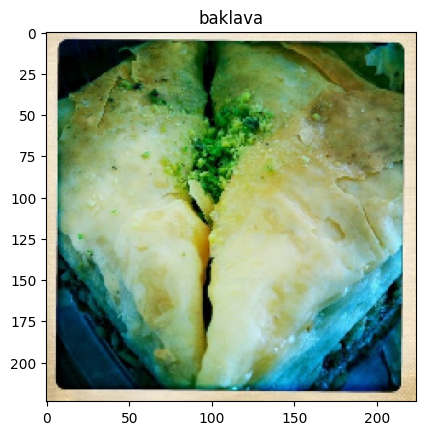

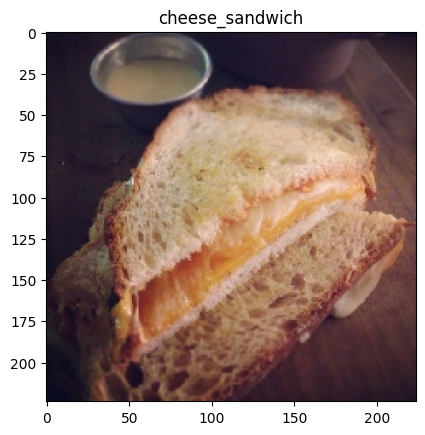

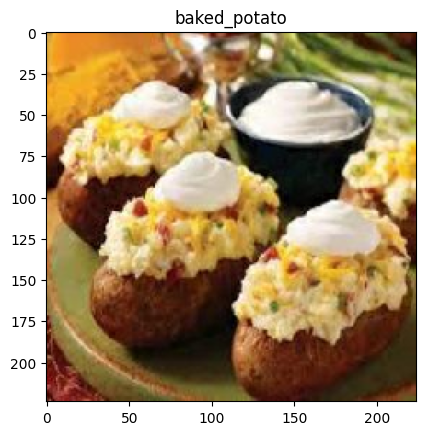

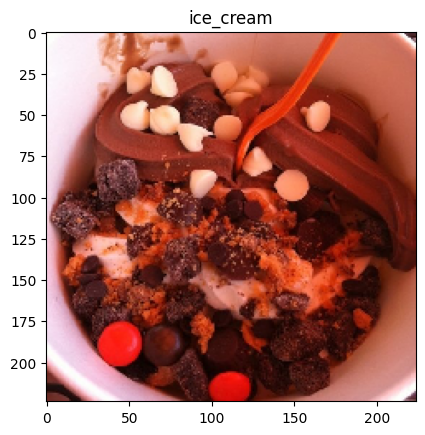

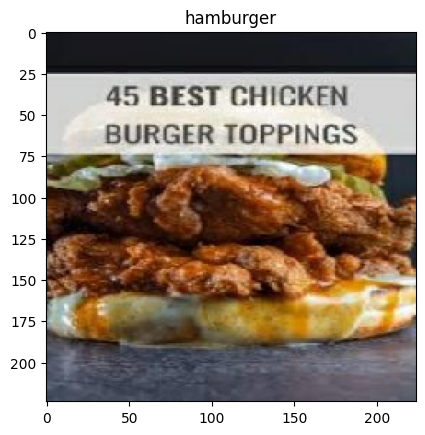

In [10]:
indexs = np.random.randint(0, 17045, 10)
for i in indexs:
    plt.imshow(training_data[i // 32][0][i - i //32 * 32])
    plt.title(get_key(training_data.class_indices, np.argmax(training_data[i // 32][1][i - i //32 * 32])))
    plt.show()

#### Make model

##### VGG OR INCEPTION

In [11]:
conv_model = inception_v3.InceptionV3(weights='imagenet', input_shape=(224,224,3), include_top=False)

x = conv_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(22, activation='softmax')(x)
model = Model(inputs=conv_model.input, outputs=predictions)
for layer in conv_model.layers:
    layer.trainable = False
model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 24,169,014 (92.20 MB)

 Trainable params: 2,366,230 (9.03 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [12]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [13]:
model.fit(training_data, validation_data=validation_data, epochs=10, shuffle=False)

Epoch 1/10


I0000 00:00:1712826099.815526     120 service.cc:145] XLA service 0x7ecd28003950 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1712826099.815576     120 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1712826099.815580     120 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  2/533 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - accuracy: 0.1016 - loss: 3.4613  

I0000 00:00:1712826110.286509     120 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


533/533 ━━━━━━━━━━━━━━━━━━━━ 86s 126ms/step - accuracy: 0.5494 - loss: 1.5970 - val_accuracy: 0.6720 - val_loss: 1.0810
Epoch 2/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - accuracy: 0.7255 - loss: 0.9132 - val_accuracy: 0.7086 - val_loss: 0.9989
Epoch 3/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - accuracy: 0.7598 - loss: 0.7951 - val_accuracy: 0.6874 - val_loss: 1.0713
Epoch 4/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - accuracy: 0.7939 - loss: 0.6746 - val_accuracy: 0.7187 - val_loss: 0.9586
Epoch 5/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - accuracy: 0.8212 - loss: 0.5754 - val_accuracy: 0.7155 - val_loss: 0.9878
Epoch 6/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - accuracy: 0.8422 - loss: 0.5028 - val_accuracy: 0.7176 - val_loss: 1.1076
Epoch 7/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - accuracy: 0.8628 - loss: 0.4342 - val_accuracy: 0.7256 - val_loss: 1.0966
Epoch 8/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 44s 82ms/step - accuracy: 0.8760 - loss: 0.3826 - val_accura

In [14]:
conv_model = vgg19.VGG19(weights='imagenet', input_shape=(224,224,3), include_top=False)

x = conv_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(22, activation='softmax')(x)
model = Model(inputs=conv_model.input, outputs=predictions)
for layer in conv_model.layers:
    layer.trainable = False
model.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 20,817,750 (79.41 MB)

 Trainable params: 793,366 (3.03 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [15]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [16]:
model.fit(training_data, validation_data=validation_data, epochs=10, shuffle=False)

Epoch 1/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 137s 221ms/step - accuracy: 0.2490 - loss: 2.5455 - val_accuracy: 0.4421 - val_loss: 1.8556
Epoch 2/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 87s 163ms/step - accuracy: 0.4700 - loss: 1.7509 - val_accuracy: 0.5064 - val_loss: 1.6420
Epoch 3/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 87s 163ms/step - accuracy: 0.5329 - loss: 1.5617 - val_accuracy: 0.5042 - val_loss: 1.6180
Epoch 4/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 87s 162ms/step - accuracy: 0.5537 - loss: 1.4697 - val_accuracy: 0.5133 - val_loss: 1.6162
Epoch 5/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 87s 162ms/step - accuracy: 0.5758 - loss: 1.3857 - val_accuracy: 0.5223 - val_loss: 1.5403
Epoch 6/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 87s 162ms/step - accuracy: 0.5918 - loss: 1.3277 - val_accuracy: 0.5541 - val_loss: 1.4778
Epoch 7/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 87s 163ms/step - accuracy: 0.6117 - loss: 1.2622 - val_accuracy: 0.5541 - val_loss: 1.4822
Epoch 8/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 87s 162ms/step - accuracy: 0.6215 - loss: 

### We continue with inception model

#### Test preprocessing_function

In [22]:
image_generator = ImageDataGenerator(
    validation_split=0.1,
    preprocessing_function=inception_v3.preprocess_input,
)

In [23]:
training_data = image_generator.flow_from_directory(
    directory='/kaggle/working/datas',
    class_mode='categorical',
    batch_size=32,
    target_size=(224,224),
    subset='training',
    shuffle=True,
    seed=42,
)

Found 17045 images belonging to 22 classes.


In [24]:
validation_data = image_generator.flow_from_directory(
    directory='/kaggle/working/datas',
    class_mode='categorical',
    batch_size=32,
    target_size=(224,224),
    subset='validation',
    shuffle=True,
    seed=42
)

Found 1884 images belonging to 22 classes.


In [25]:
conv_model = inception_v3.InceptionV3(weights='imagenet', input_shape=(224,224,3), include_top=False)

x = conv_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(22, activation='softmax')(x)
model = Model(inputs=conv_model.input, outputs=predictions)
for layer in conv_model.layers:
    layer.trainable = False
model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_188 (Conv2D) │ (None, 111, 111,  │        864 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d_188[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_188      │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_189 (Conv2D) │ (None, 109, 109,  │      9,216 │ activation_188[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_189[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_189      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_190 (Conv2D) │ (None, 109, 109,  │     18,432 │ activation_189[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_190[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_190      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 54, 54,    │          0 │ activation_190[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_191 (Conv2D) │ (None, 54, 54,    │      5,120 │ max_pooling2d_8[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_191[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_191      │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_192 (Conv2D) │ (None, 52, 52,    │    138,240 │ activation_191[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_192[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_192      │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 24,169,014 (92.20 MB)

 Trainable params: 2,366,230 (9.03 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [26]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [27]:
model.fit(training_data, validation_data=validation_data, epochs=10, shuffle=False)

Epoch 1/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 70s 109ms/step - accuracy: 0.5453 - loss: 1.6086 - val_accuracy: 0.6969 - val_loss: 1.0122
Epoch 2/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - accuracy: 0.7297 - loss: 0.8941 - val_accuracy: 0.7070 - val_loss: 0.9778
Epoch 3/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - accuracy: 0.7729 - loss: 0.7496 - val_accuracy: 0.7240 - val_loss: 0.9145
Epoch 4/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - accuracy: 0.8031 - loss: 0.6357 - val_accuracy: 0.7330 - val_loss: 0.8994
Epoch 5/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - accuracy: 0.8269 - loss: 0.5623 - val_accuracy: 0.7118 - val_loss: 1.0200
Epoch 6/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - accuracy: 0.8441 - loss: 0.4927 - val_accuracy: 0.7378 - val_loss: 0.9835
Epoch 7/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - accuracy: 0.8652 - loss: 0.4178 - val_accuracy: 0.7288 - val_loss: 1.0405
Epoch 8/10
533/533 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - accuracy: 0.8897 - loss: 0.3524 -

#### Continue without preprocessing_function 🥹🥹🥹

In [28]:
image_generator = ImageDataGenerator(
    rescale=1 / 255.0,
    validation_split=0.1,
    # rotation_range=30,
    # width_shift_range=0.3,
    # height_shift_range=0.3,
    # shear_range=0.4,
    # zoom_range=0.8,
)

In [29]:
training_data = image_generator.flow_from_directory(
    directory='/kaggle/working/datas',
    class_mode='categorical',
    batch_size=32,
    target_size=(224,224),
    subset='training',
    shuffle=True,
    seed=42,
)

Found 17045 images belonging to 22 classes.


In [30]:
validation_data = image_generator.flow_from_directory(
    directory='/kaggle/working/datas',
    class_mode='categorical',
    batch_size=32,
    target_size=(224,224),
    subset='validation',
    shuffle=True,
    seed=42
)

Found 1884 images belonging to 22 classes.


In [31]:
conv_model_1 = inception_v3.InceptionV3(weights='imagenet', input_shape=(224,224,3), include_top=False)

x = conv_model_1.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(22, activation='softmax')(x)
model_1 = Model(inputs=conv_model_1.input, outputs=predictions)
for layer in conv_model_1.layers:
    layer.trainable = False
model_1.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_282 (Conv2D) │ (None, 111, 111,  │        864 │ input_layer_4[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d_282[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_282      │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_283 (Conv2D) │ (None, 109, 109,  │      9,216 │ activation_282[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_283[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_283      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_284 (Conv2D) │ (None, 109, 109,  │     18,432 │ activation_283[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_284[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_284      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_12    │ (None, 54, 54,    │          0 │ activation_284[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_285 (Conv2D) │ (None, 54, 54,    │      5,120 │ max_pooling2d_12… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_285[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_285      │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_286 (Conv2D) │ (None, 52, 52,    │    138,240 │ activation_285[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_286[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_286      │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 24,169,014 (92.20 MB)

 Trainable params: 2,366,230 (9.03 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [32]:
callbacks_1 = [
    EarlyStopping(patience=10),
    ModelCheckpoint(filepath='/kaggle/working/model_1/model_1.keras',
    monitor='val_accuracy',
    mode='max',
    save_best_only=True),
    TensorBoard(log_dir='/kaggle/working/model_1/logs_1'),
]
model_1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [33]:
history_1 = model_1.fit(training_data, validation_data=validation_data, epochs=50, shuffle=False, callbacks=callbacks_1)

Epoch 1/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 73s 111ms/step - accuracy: 0.4923 - loss: 1.7885 - val_accuracy: 0.6789 - val_loss: 1.1260
Epoch 2/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - accuracy: 0.6732 - loss: 1.0928 - val_accuracy: 0.7038 - val_loss: 0.9727
Epoch 3/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - accuracy: 0.7074 - loss: 0.9599 - val_accuracy: 0.7187 - val_loss: 0.9703
Epoch 4/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - accuracy: 0.7371 - loss: 0.8713 - val_accuracy: 0.7113 - val_loss: 0.9686
Epoch 5/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - accuracy: 0.7550 - loss: 0.8066 - val_accuracy: 0.7192 - val_loss: 0.9325
Epoch 6/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - accuracy: 0.7658 - loss: 0.7659 - val_accuracy: 0.7298 - val_loss: 0.9405
Epoch 7/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - accuracy: 0.7775 - loss: 0.7101 - val_accuracy: 0.7373 - val_loss: 0.9145
Epoch 8/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - accuracy: 0.7954 - loss: 0.6476 -

In [34]:
model_1.save('/kaggle/working/model_1/model_1_final.keras')

In [35]:
conv_model_2 = inception_v3.InceptionV3(weights='imagenet', input_shape=(224,224,3), include_top=False)

x = conv_model_2.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(22, activation='softmax')(x)
model_2 = Model(inputs=conv_model_2.input, outputs=predictions)
for layer in model_2.layers[:249]:
   layer.trainable = False
for layer in model_2.layers[249:]:
   layer.trainable = True
model_2.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_376 (Conv2D) │ (None, 111, 111,  │        864 │ input_layer_5[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d_376[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_376      │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_377 (Conv2D) │ (None, 109, 109,  │      9,216 │ activation_376[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_377[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_377      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_378 (Conv2D) │ (None, 109, 109,  │     18,432 │ activation_377[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_378[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_378      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_16    │ (None, 54, 54,    │          0 │ activation_378[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_379 (Conv2D) │ (None, 54, 54,    │      5,120 │ max_pooling2d_16… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_379[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_379      │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_380 (Conv2D) │ (None, 52, 52,    │    138,240 │ activation_379[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_380[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_380      │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 24,169,014 (92.20 MB)

 Trainable params: 13,481,110 (51.43 MB)

 Non-trainable params: 10,687,904 (40.77 MB)

In [36]:
callbacks_2 = [
    EarlyStopping(patience=10),
    ModelCheckpoint(filepath='/kaggle/working/model_2/model_2.keras',
    monitor='val_accuracy',
    mode='max',
    save_best_only=True),
    TensorBoard(log_dir='/kaggle/working/model_2/logs_2'),
]
model_2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [37]:
history_2 = model_2.fit(training_data, validation_data=validation_data, epochs=50, shuffle=False, callbacks=callbacks_2)

Epoch 1/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 97s 130ms/step - accuracy: 0.5984 - loss: 1.4363 - val_accuracy: 0.7240 - val_loss: 1.0682
Epoch 2/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - accuracy: 0.8165 - loss: 0.6468 - val_accuracy: 0.7834 - val_loss: 0.8651
Epoch 3/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - accuracy: 0.8801 - loss: 0.4175 - val_accuracy: 0.7941 - val_loss: 0.8717
Epoch 4/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 49s 93ms/step - accuracy: 0.9148 - loss: 0.3010 - val_accuracy: 0.8025 - val_loss: 0.8668
Epoch 5/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - accuracy: 0.9322 - loss: 0.2254 - val_accuracy: 0.7765 - val_loss: 1.0396
Epoch 6/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - accuracy: 0.9464 - loss: 0.1845 - val_accuracy: 0.8073 - val_loss: 0.9167
Epoch 7/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.9591 - loss: 0.1436 - val_accuracy: 0.7813 - val_loss: 1.0206
Epoch 8/50
533/533 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.9616 - loss: 0.1357 -

In [45]:
model_2.save('/kaggle/working/model_2/model_2_final.keras')

## Evaluate model

### Model 1

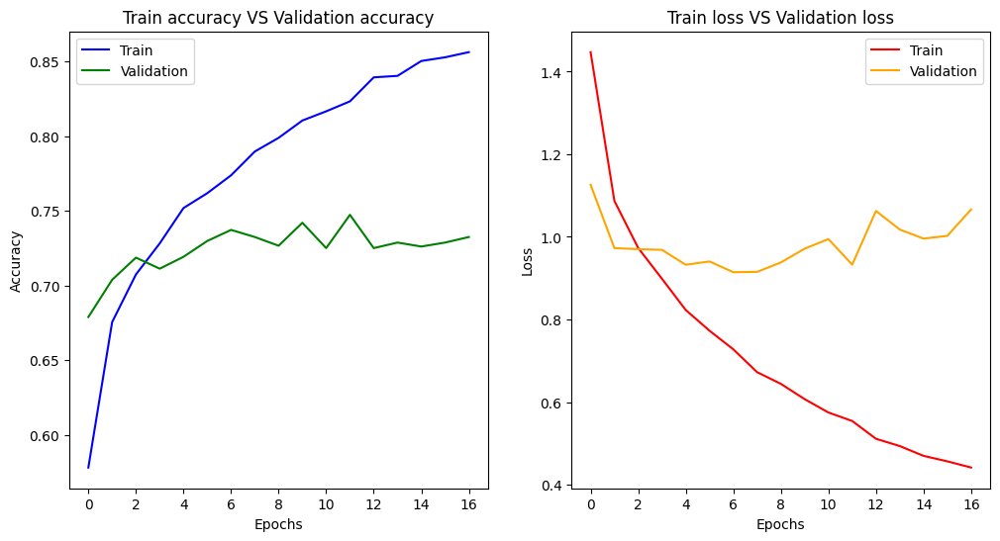

In [38]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history_1.history['accuracy'], c='blue', label='Train')
plt.plot(history_1.history['val_accuracy'], c='green', label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Train accuracy VS Validation accuracy')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(history_1.history['loss'], c='red', label='Train')
plt.plot(history_1.history['val_loss'], c='orange', label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train loss VS Validation loss')
plt.legend();

In [39]:
loss, accuracy = model_1.evaluate(validation_data)
print('Final loss :{:.2f} \nFinal accuracy {:.2f}'.format(loss, accuracy))

59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.7261 - loss: 1.1135
Final loss :1.07 
Final accuracy 0.73


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


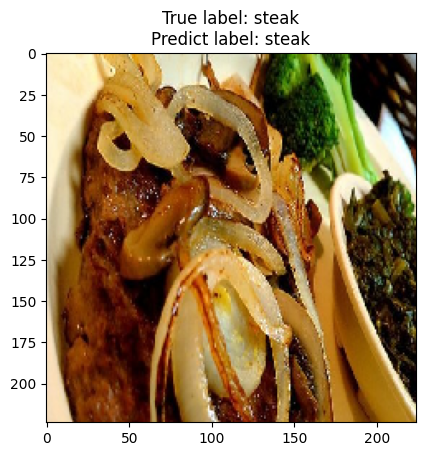

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


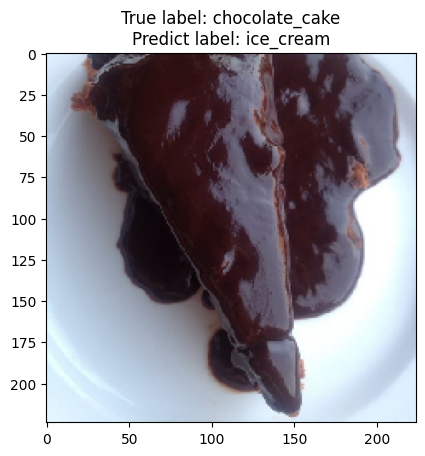

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


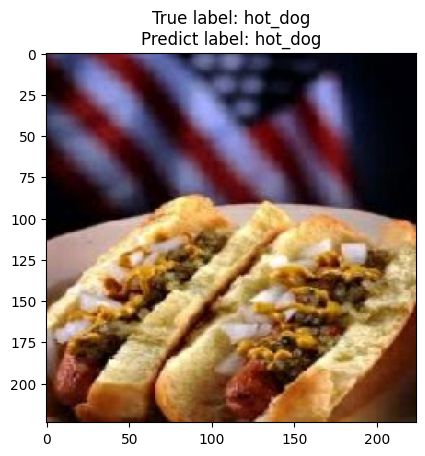

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


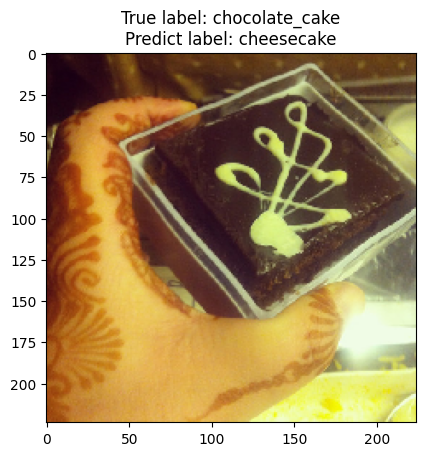

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


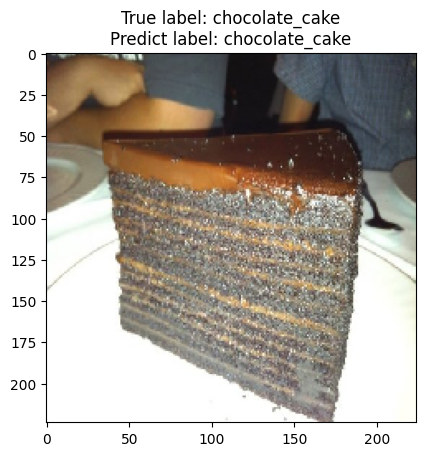

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


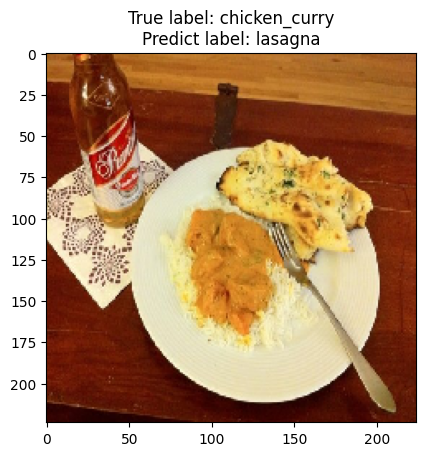

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


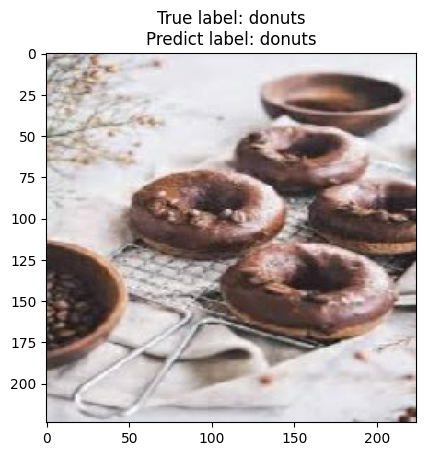

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


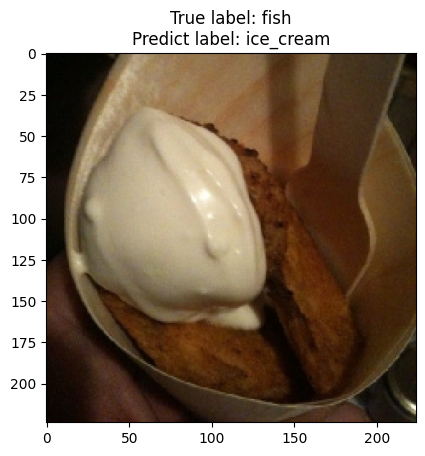

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


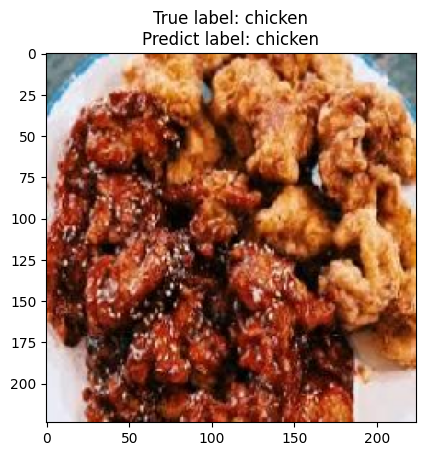

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


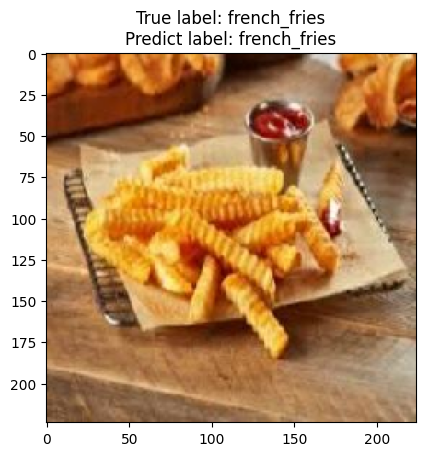

In [40]:
indexs = np.random.randint(0, 1884, 10)
for i in indexs:
    plt.imshow(validation_data[i // 32][0][i - i // 32 * 32])
    plt.title('True label: ' + get_key(validation_data.class_indices, np.argmax(validation_data[i // 32][1][i - i //32 * 32])) + '\n' + 'Predict label: ' + get_key(validation_data.class_indices, np.argmax(model_1.predict(np.expand_dims(validation_data[i // 32][0][i - i // 32 * 32], axis=0)), axis=1)) )
    plt.show()

### Model 2

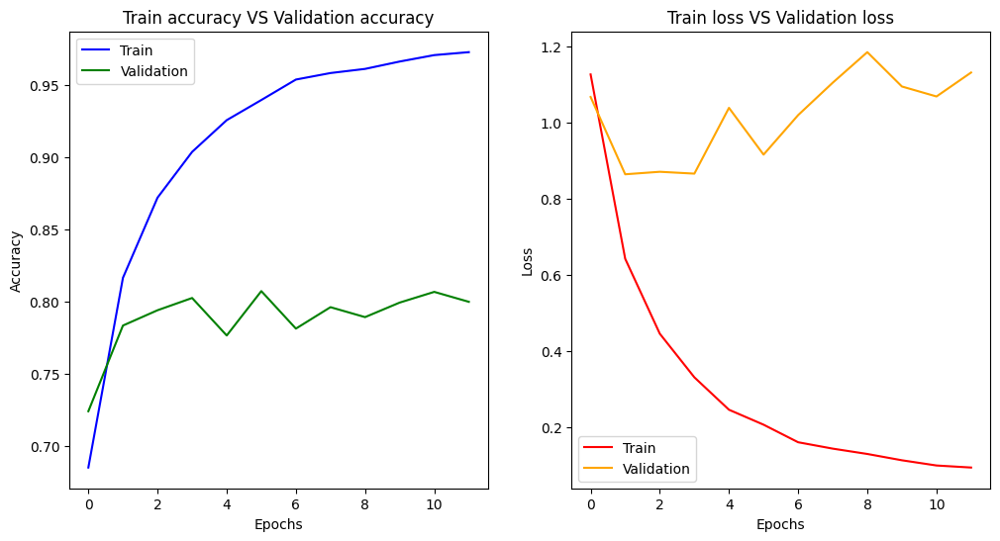

In [41]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history_2.history['accuracy'], c='blue', label='Train')
plt.plot(history_2.history['val_accuracy'], c='green', label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Train accuracy VS Validation accuracy')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(history_2.history['loss'], c='red', label='Train')
plt.plot(history_2.history['val_loss'], c='orange', label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train loss VS Validation loss')
plt.legend();

In [42]:
loss, accuracy = model_2.evaluate(validation_data)
print('Final loss :{:.2f} \nFinal accuracy {:.2f}'.format(loss, accuracy))

59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.7902 - loss: 1.1969
Final loss :1.13 
Final accuracy 0.80


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


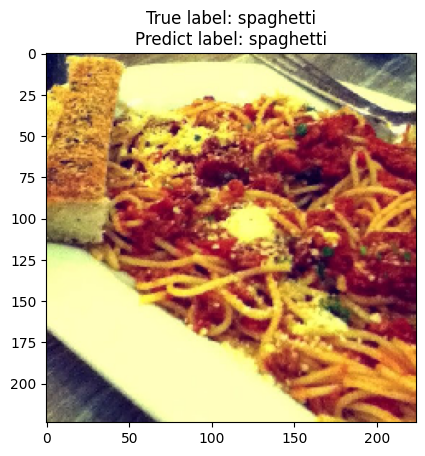

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


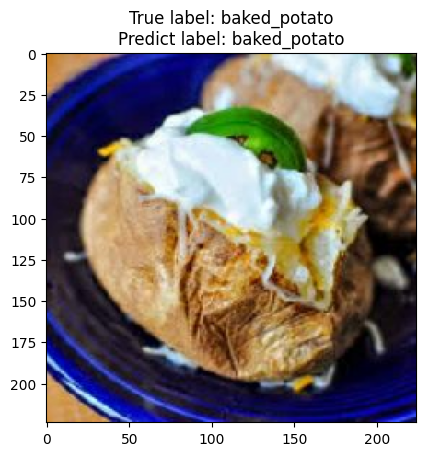

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


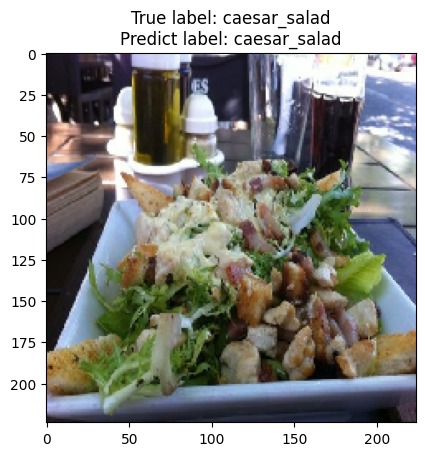

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


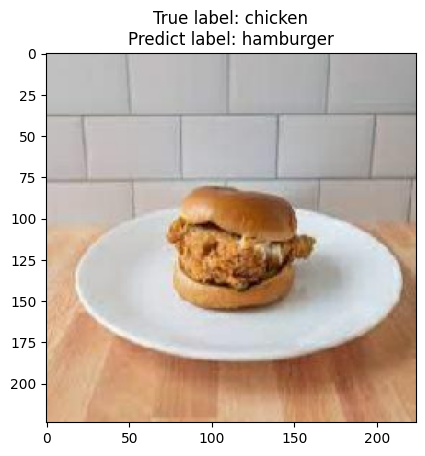

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


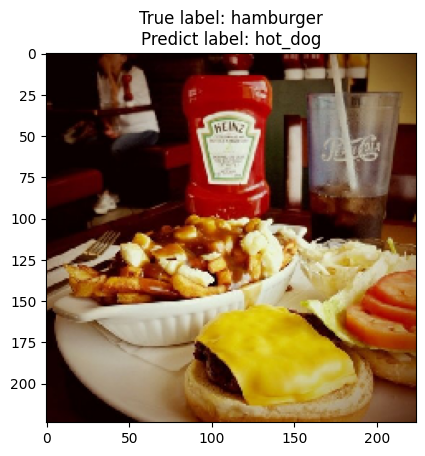

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


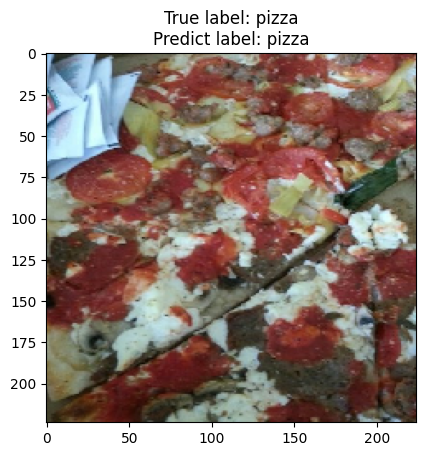

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


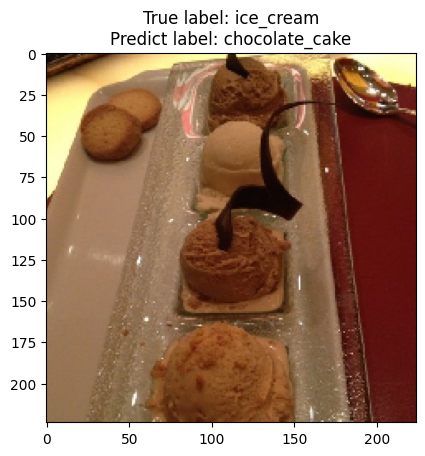

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


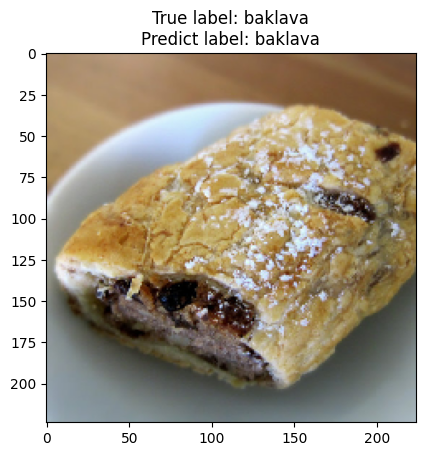

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


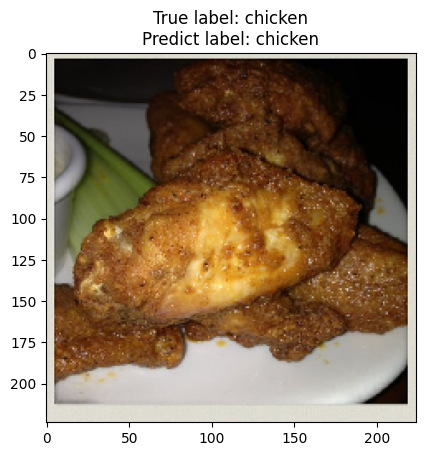

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


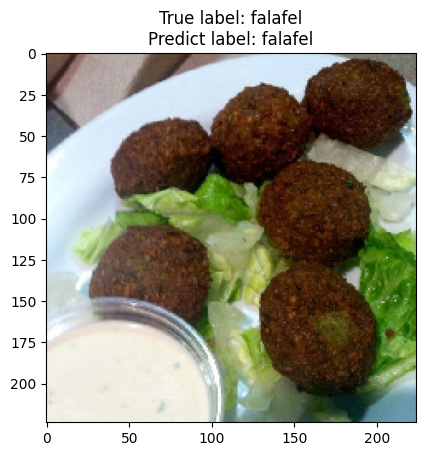

In [43]:
indexs = np.random.randint(0, 1884, 10)
for i in indexs:
    plt.imshow(validation_data[i // 32][0][i - i // 32 * 32])
    plt.title('True label: ' + get_key(validation_data.class_indices, np.argmax(validation_data[i // 32][1][i - i //32 * 32])) + '\n' + 'Predict label: ' + get_key(validation_data.class_indices, np.argmax(model_2.predict(np.expand_dims(validation_data[i // 32][0][i - i // 32 * 32], axis=0)), axis=1)) )
    plt.show()

In [44]:
import json
with open('class_indices.json', 'w') as f:
    json.dump(training_data.class_indices, f)